In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fast-food-restaurants/Datafiniti_Fast_Food_Restaurants_May19.csv
/kaggle/input/glove6b100dtxt/glove.6B.100d.txt


# **Project Name : Restaurant Classification**

# **Problem Statement**

Market contest and problem summary for restaurant records in the YELP business database, details on type of cuisine served are captured .When a cuisine type as not been captured for a particular restaurant , cuisine types are assigned best on key words in the business name ,this process was originally created on AS400 and recently migrated to BDBX .due to system limitations, The process only assigns 35 of the piece -100_ cuisine types   available in the YELP platform .in addition, these systems are only able to assign / stored one cuisine type per restaurant  where the YELP platform  allows the multiple .
STRATEGY:
Expand the cuisine assignment process to consider all 100_ supported cuisine type and assign multiple cuisine types where applicable.
Value propositions:
Proper and granular categorization of businesses is critical to many clients the best way to appropriately categorize restaurants is by identifying the cuisines served at each location.
Expected Outcome:
1-Updated keyword table 
2-Programatic assignment of all 100_cuisine types 
3-Programatic assignment of multiple cuisine types per restaurants.

HELP
NLP problem , Multilearn  ML SVC  KNN ,label powerset 1 virses rest classifier, Deep Nural networks, CNN, ANN, GloveLSTM ,RNN 

Pearson correlation matrix ,k lib, check linearity heatplot ,P value, 
Search evaluation techniques .

## **Import Libraries**

In [2]:
# Importing Required Libraries
import pandas as pd
import numpy as np
from numpy import percentile
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import re # for regular expressions
import sys
from nltk.stem.snowball import SnowballStemmer
import warnings
warnings.filterwarnings('ignore' ,  category=FutureWarning)
%matplotlib inline
import nltk
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.naive_bayes import MultinomialNB
from skmultilearn.problem_transform import ClassifierChain
from sklearn.linear_model import LogisticRegression
from sklearn.multioutput import MultiOutputClassifier
from sklearn.neighbors import KNeighborsClassifier
from skmultilearn.problem_transform import BinaryRelevance
from sklearn.naive_bayes import GaussianNB
from wordcloud import WordCloud

## **Load The Data**

In [3]:
df = pd.read_csv('../input/fast-food-restaurants/Datafiniti_Fast_Food_Restaurants_May19.csv')

## **Looking Into Data**

In [4]:
#lets take a look 
df

,id,dateAdded,dateUpdated,address,categories,primaryCategories,city,country,keys,latitude,longitude,name,postalCode,province,sourceURLs,websites
0,AWrSh_KgsVYjT2BJAzaH,2019-05-19T23:58:05Z,2019-05-19T23:58:05Z,2555 11th Avenue,"Fast Food Restaurants,Hamburgers and Hot Dogs,...",Accommodation & Food Services,Greeley,US,us/co/greeley/255511thavenue/554191587,40.396290,-104.696990,Carl's Jr.,80631,CO,https://www.yellowpages.com/greeley-co/mip/car...,https://www.carlsjr.com/?utm_source=Yextandutm...
1,AWEKlA-LIxWefVJwxG9B,2018-01-18T18:30:23Z,2019-05-19T23:45:05Z,2513 Highway 6 And 50,"Restaurant,Mexican Restaurants,Fast Food Resta...",Accommodation & Food Services,Grand Junction,US,us/co/grandjunction/2513highway6and50/1550891556,39.081350,-108.586890,Del Taco,81505,CO,http://www.citysearch.com/profile/772076870/gr...,http://www.deltaco.com
2,AWrSfAcYsVYjT2BJAzPt,2019-05-19T23:45:04Z,2019-05-19T23:45:04Z,1125 Patterson Road,"Sandwich Shops,Fast Food Restaurants,Restauran...",Accommodation & Food Services,Grand Junction,US,us/co/grandjunction/1125pattersonroad/-2137447852,39.091480,-108.554110,Which Wich,81506,CO,https://www.yellowpages.com/grand-junction-co/...,http://www.whichwich.com
3,AWrSa3NAQTFama1Xpkbz,2019-05-19T23:26:58Z,2019-05-19T23:26:58Z,3455 N Salida Court,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Aurora,US,us/co/aurora/3455nsalidacourt/1143321601,39.763690,-104.776710,Chipotle Mexican Grill,80011,CO,https://www.yellowpages.com/aurora-co/mip/chip...,http://www.chipotle.com
4,AWrSaVGzZ4Yw-wtdgcaB,2019-05-19T23:24:38Z,2019-05-19T23:24:38Z,5225 E Colfax Avenue,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Denver,US,us/co/denver/5225ecolfaxavenue/-864103396,39.740440,-104.926360,Taco Bell,80220,CO,https://www.yellowpages.com/denver-co/mip/taco...,https://locations.tacobell.com/co/denver/5225-...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,AVwd7U0T_7pvs4fz-fS_,2016-05-31T13:33:45Z,2018-12-03T09:04:19Z,1803 Carolina Ave,"American Restaurants,Caterers,Soul Food Restau...",Accommodation & Food Services,Bessemer,US,us/al/bessemer/1803carolinaave/785498836,33.399574,-86.951050,Church's Chicken Of Birmingham,35020,AL,http://www.yellowpages.com/bessemer-al/mip/chu...,http://www.churchs.com
9996,AV1XW1fF3D1zeR_xFKHL,2017-07-18T20:19:50Z,2018-12-02T00:08:36Z,8511 Cantilever Way Ste 105,"Mexican Restaurants,Caterers,Delicatessens,Iri...",Accommodation & Food Services,Raleigh,US,us/nc/raleigh/8511cantileverwayste105/-1596320866,35.884500,-78.737541,Luxury Box,27613-6996,NC,https://www.bbb.org/us/nc/raleigh/profile/spor...,"http://www.theluxuryboxofraleigh.com,http://th..."
9997,AV5UVbkiRxPSIh2RiQxV,2017-09-05T23:05:50Z,2018-12-01T07:38:03Z,2601 Plover Rd,"Carry-out food,Hot dog restaurants,Fast Food R...",Accommodation & Food Services,Plover,US,us/wi/plover/2601ploverrd/-1161002137,44.453180,-89.543170,McDonald's,54467,WI,https://www.yellowpages.com/plover-wi/mip/mcdo...,"http://mcdonalds.com,http://www.mcdonalds.com/..."
9998,AVwc9BxYByjofQCxj_GW,2016-03-31T02:43:12Z,2018-12-01T07:35:22Z,170 E Main St,"Carry-out food,Caterers,Restaurant delivery se...",Accommodation & Food Services,Hendersonville,US,us/tn/hendersonville/170emainst/-66712705,36.308262,-86.607339,Pizza Hut,37075,TN,https://foursquare.com/v/pizza-hut/4c5fffd43a3...,http://www.pizzahut.com


In [5]:
#checking the info 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 10000 non-null  object 
 1   dateAdded          10000 non-null  object 
 2   dateUpdated        10000 non-null  object 
 3   address            10000 non-null  object 
 4   categories         10000 non-null  object 
 5   primaryCategories  10000 non-null  object 
 6   city               10000 non-null  object 
 7   country            10000 non-null  object 
 8   keys               10000 non-null  object 
 9   latitude           10000 non-null  float64
 10  longitude          10000 non-null  float64
 11  name               10000 non-null  object 
 12  postalCode         10000 non-null  object 
 13  province           10000 non-null  object 
 14  sourceURLs         10000 non-null  object 
 15  websites           9918 non-null   object 
dtypes: float64(2), object(1

In [6]:
#checking null values
df.isna().sum()

id                    0
dateAdded             0
dateUpdated           0
address               0
categories            0
primaryCategories     0
city                  0
country               0
keys                  0
latitude              0
longitude             0
name                  0
postalCode            0
province              0
sourceURLs            0
websites             82
dtype: int64

there is only null values in website variable.

<AxesSubplot:>

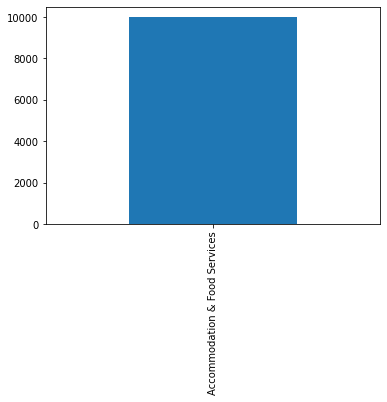

In [7]:
df['primaryCategories'].value_counts()[:10].plot(kind='bar')

<AxesSubplot:>

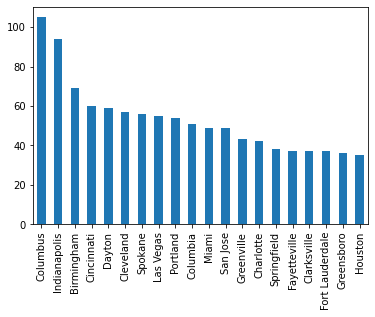

In [8]:
#looking into city variable
df['city'].value_counts()[:20].plot(kind= 'bar')

<AxesSubplot:>

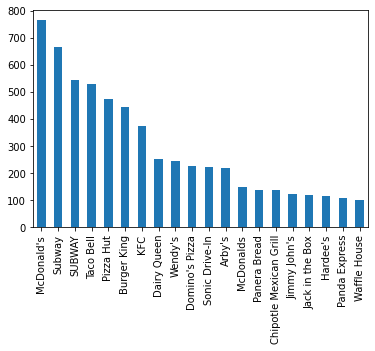

In [9]:
df['name'].value_counts()[:20].plot(kind= 'bar')

# **Data Cleaing**

we are going to work on catageroy variable and in that variable there is some noise we have to remove.

## **Lowering the text**
It is one of the most common preprocessing steps where the text is converted into the same case preferably lower case.

In [10]:
df['new_categories']=df['categories'].apply(lambda x:x.lower())

df[['categories','new_categories']].head(5)

,categories,new_categories
0,"Fast Food Restaurants,Hamburgers and Hot Dogs,...","fast food restaurants,hamburgers and hot dogs,..."
1,"Restaurant,Mexican Restaurants,Fast Food Resta...","restaurant,mexican restaurants,fast food resta..."
2,"Sandwich Shops,Fast Food Restaurants,Restauran...","sandwich shops,fast food restaurants,restauran..."
3,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food restaurants,mexican restaurants,rest..."
4,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food restaurants,mexican restaurants,rest..."


## **Removing Stop Words**

In [11]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [12]:
allstopwords = stopwords.words('english')
df['new_categories'] =df['new_categories'].apply(lambda x: " ".join(i for i in x.split() if i not in allstopwords))
df[['categories','new_categories']].head(5)

,categories,new_categories
0,"Fast Food Restaurants,Hamburgers and Hot Dogs,...","fast food restaurants,hamburgers hot dogs,rest..."
1,"Restaurant,Mexican Restaurants,Fast Food Resta...","restaurant,mexican restaurants,fast food resta..."
2,"Sandwich Shops,Fast Food Restaurants,Restauran...","sandwich shops,fast food restaurants,restauran..."
3,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food restaurants,mexican restaurants,rest..."
4,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food restaurants,mexican restaurants,rest..."


## **Removing unwanted text patterns from the categories**

In [13]:
#remove unwanted text patterns from the categories
def remove_pattern(input_txt,pattern):
  r = re.findall(pattern,input_txt)
  for i in r:
    input_txt = re.sub(i,'',input_txt)
  return input_txt

In [14]:
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'restaurants')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'restaurant')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'take out')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'carry-out food')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'manufacturers')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'cypress station')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'caterers')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'delivery service')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'uncategorized')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'women\'s clothing')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'delis')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'hotels and motel')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'&')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'catering')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'airport devonshire')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'airport')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],"bars")
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'- full service')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'clubs')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],"pubs")
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'american canoga park')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'american cape fear')
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],"american downtown blacksburg	")
df['new_categories'] = np.vectorize(remove_pattern)(df['new_categories'],'  american canoga park')


In [15]:
df[['categories','new_categories']].head(5)

,categories,new_categories
0,"Fast Food Restaurants,Hamburgers and Hot Dogs,...","fast food ,hamburgers hot dogs,"
1,"Restaurant,Mexican Restaurants,Fast Food Resta...",",mexican ,fast food ,"
2,"Sandwich Shops,Fast Food Restaurants,Restauran...","sandwich shops,fast food ,,take"
3,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food ,mexican ,,take"
4,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food ,mexican ,"


# **EDA**

## **Heat map for missing values**

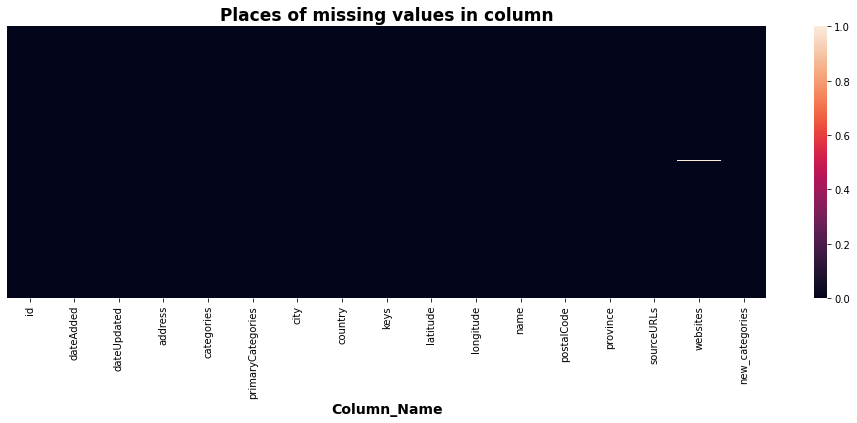

In [16]:
plt.figure(figsize=(17, 5))
sns.heatmap(df.isnull(), cbar=True, yticklabels=False)
plt.xlabel("Column_Name", size=14, weight="bold")
plt.title("Places of missing values in column",fontweight="bold",size=17)
plt.show()

## **checking unique values from each colum**

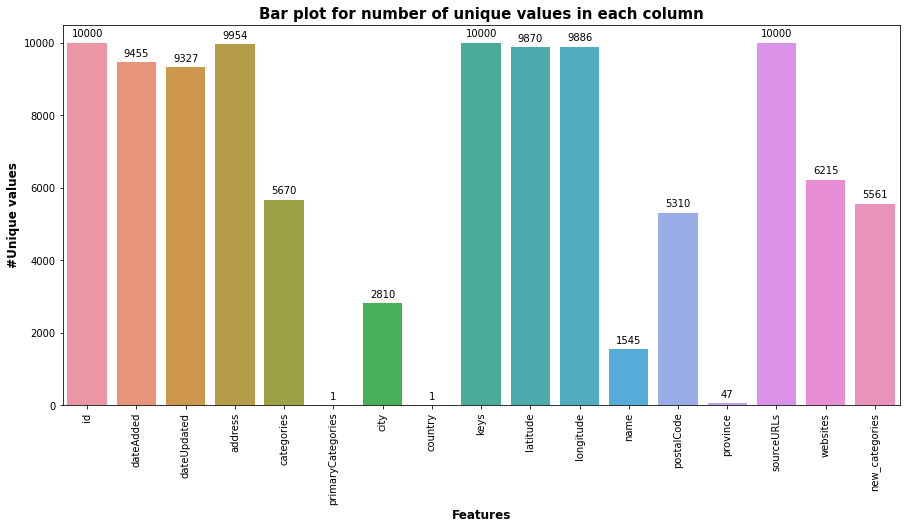

In [17]:
unique_df = pd.DataFrame()
unique_df['Features'] = df.columns
unique=[]
for i in df.columns:
    unique.append(df[i].nunique())
unique_df['Uniques'] = unique

f, ax = plt.subplots(1,1, figsize=(15,7))

splot = sns.barplot(x=unique_df['Features'], y=unique_df['Uniques'], alpha=1)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center',
                   va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.title('Bar plot for number of unique values in each column',weight='bold', size=15)
plt.ylabel('#Unique values', size=12, weight='bold')
plt.xlabel('Features', size=12, weight='bold')
plt.xticks(rotation=90)
plt.show()

Observations :
1. we have data from only one country US and nearly about  from 2810 cities.
2. we have data from 47 province.

## **Understanding the common words used in the new_categories: WordCloud**

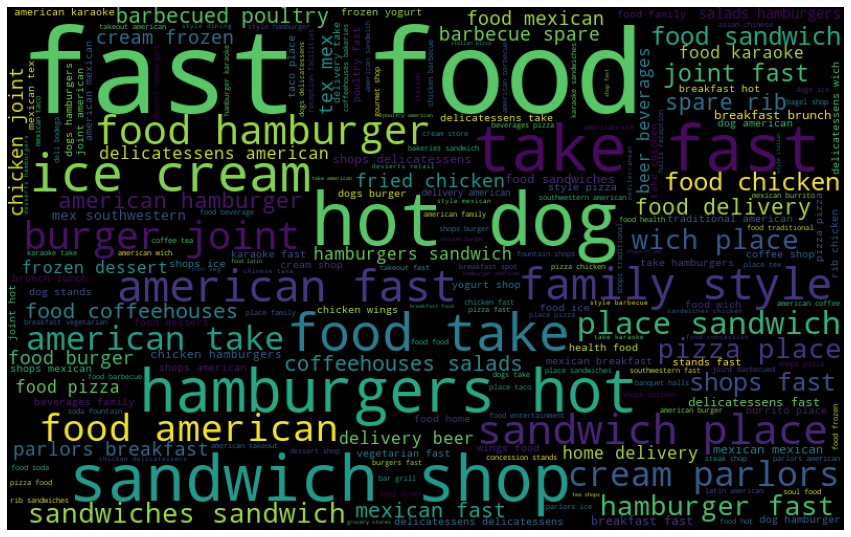

In [18]:
all_words = ' '.join([text for text in df['new_categories']]) 
WordCloud = WordCloud(width = 800 , height = 500 , random_state = 42 , max_font_size = 110 ).generate(all_words)
plt.figure(figsize=(15,15))
plt.imshow(WordCloud)
plt.axis('off')
plt.show()

In [19]:
#for the count of rest. area wise we groupby addres and count of rest. reat_name
df1 = df.groupby(['province'])['name'].aggregate('count').reset_index().sort_values('name', ascending=False)
df1.rename(columns = {'name':'Number_of_resto'}, inplace = True)

In [20]:
#info of df1
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47 entries, 33 to 6
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   province         47 non-null     object
 1   Number_of_resto  47 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 1.1+ KB


In [21]:
#displaying the values in df1
df1.head(15)

,province,Number_of_resto
33,OH,922
9,FL,739
4,CA,727
26,NC,663
1,AL,635
15,IN,519
40,TX,426
43,WA,404
42,VA,348
35,OR,334


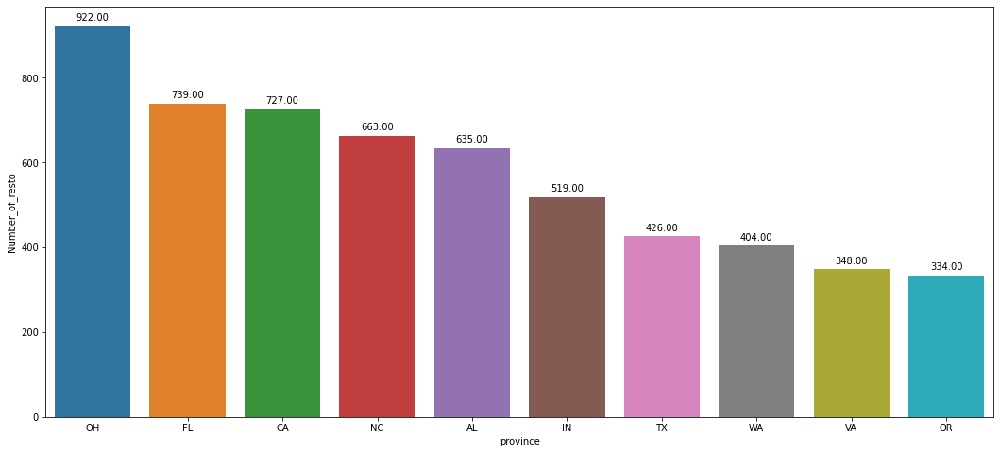

In [22]:
#ploting the graph between restaurnt name and addres
fig , ax = plt.subplots(figsize = (18,8))
splot = sns.barplot(x = 'province', y = 'Number_of_resto' , data = df1.head(10) , ax=ax)

# now simply assign the bar values to
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center',
                   va = 'center', xytext = (0, 9), textcoords = 'offset points')

In [23]:
#for the count of rest. city wise we groupby city and count of rest. reat_name
df1 = df.groupby(['city'])['name'].aggregate('count').reset_index().sort_values('name', ascending=False)
df1.rename(columns = {'name':'Number_of_resto'}, inplace = True)

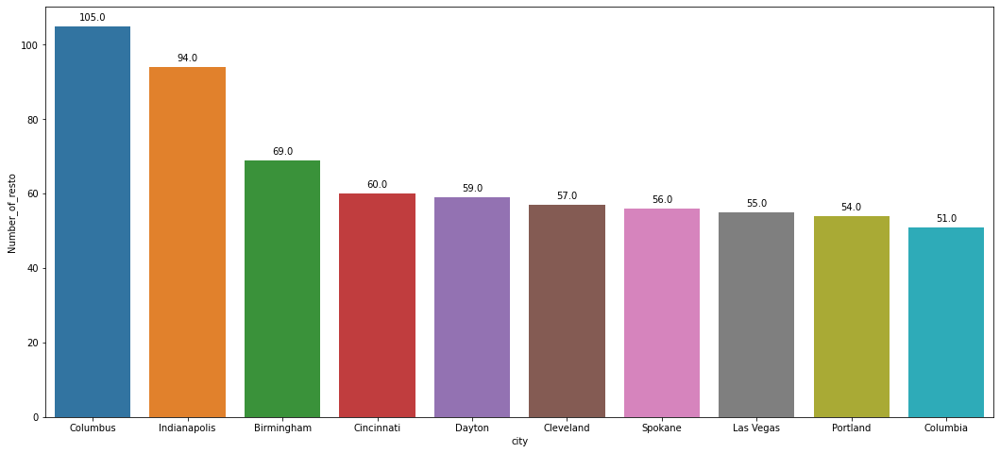

In [24]:
#ploting the graph between restaurnt name and city
fig , ax = plt.subplots(figsize = (18,8))
splot = sns.barplot(x = 'city', y = 'Number_of_resto' , data = df1.head(10) , ax=ax)

# now simply assign the bar values to
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center',
                   va = 'center', xytext = (0, 9), textcoords = 'offset points')

# **Plotting of the Restaurants on map**

In [25]:
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode(connected=True)
import plotly.graph_objs as go

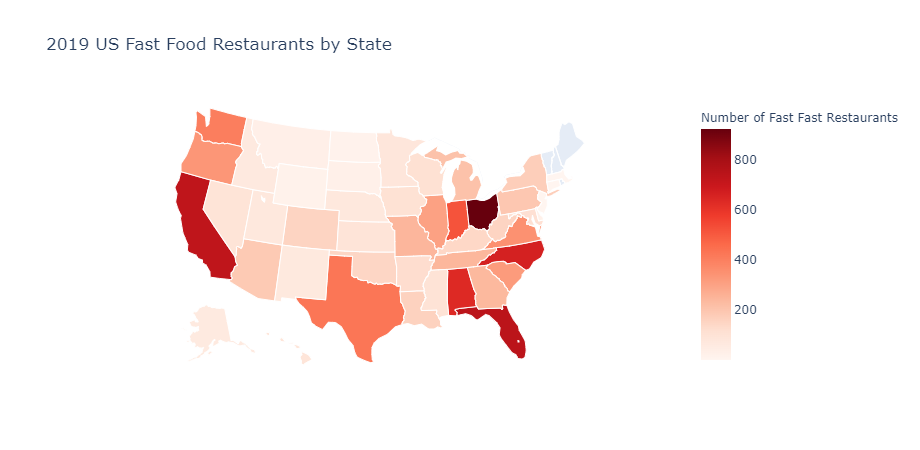

In [26]:
# create data needed
state_codes = df['province'].value_counts().index.tolist()
value_counts_by_states = df['province'].value_counts()

# plotly choropleth
data= [dict(type='choropleth',
            locations = state_codes, # Spatial coordinates
            z = value_counts_by_states, # Data to be color-coded
            locationmode = 'USA-states', # set of locations match entries in `locations`
            colorscale = 'Reds',
            marker_line_color = 'white',
            colorbar_title = "Number of Fast Fast Restaurants"
        )]
layout = dict(title = '2019 US Fast Food Restaurants by State', 
              geo = dict(scope='usa'))
iplot(dict(data=data, layout=layout))

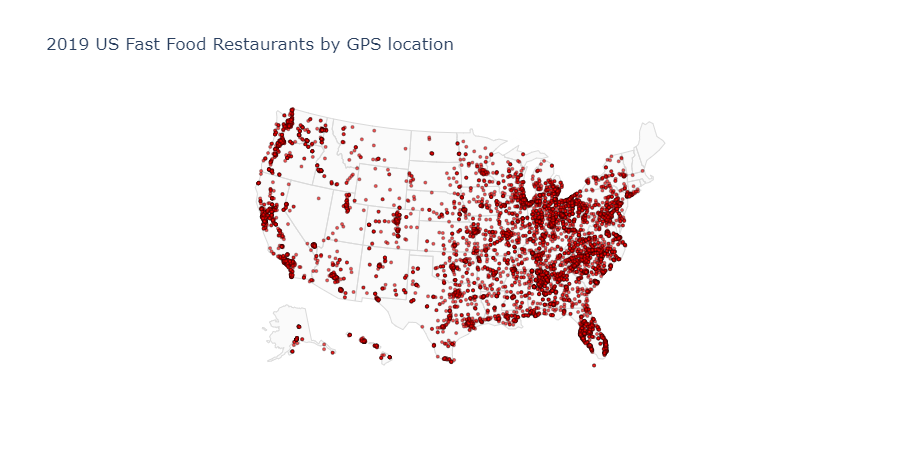

In [27]:
data = [dict(type = 'scattergeo',
            locationmode = 'USA-states',
            lon = df['longitude'],
            lat = df['latitude'],
            mode = 'markers',
            marker = dict(size = 3,
                opacity = 0.7,
                reversescale = True,
                autocolorscale = False,
                symbol = 'circle',
                line = dict(width=.5, color='black'),
                color = 'red'
            )
        )]

layout = dict(title = '2019 US Fast Food Restaurants by GPS location',
            geo = dict(scope='usa',
                showland = True,
                landcolor = "rgb(250, 250, 250)",
                subunitcolor = "rgb(217, 217, 217)"
            )
        )
iplot(dict(data=data, layout=layout ))

In [28]:
from datetime import timedelta
#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

In [29]:
address = 'US'

geolocator = Nominatim(user_agent="tr_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of US are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of US are 39.7837304, -100.445882.


In [30]:
# create map of Toronto using latitude and longitude values
map_bng = folium.Map(location=[latitude, longitude], zoom_start=9)

# add markers to map
for latitude, longitude, address, city in zip(df['latitude'], df['longitude'], df['address'], df['city']):
    label = '{}, {}'.format(address, city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [latitude, longitude],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bng)  
    
map_bng

In [31]:
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode(connected=True)
import plotly.graph_objs as go

In [32]:
# import folium package
import folium
 
mark = folium.Map(location = [39.7837304, -100.445882],zoom_start = 12)
#folium.Marker(location = [39.7837304, -100.445882]).add_to(mark)
#mark

In [33]:
for i in range(0,len(df.head(500))):
    folium.Marker([df.iloc[i]['latitude'], df.iloc[i]['longitude']]).add_to(mark)
mark

# **Feature Engineering**

### combining colums to details address

In [34]:
# address, city, country, lattitude, longitude, name, postal code, province, website
df["detailed_address"] = df["name"] + df["address"]+  df["city"] + df["country"]+ df["latitude"].astype(str) + df["longitude"].astype(str)+ df["postalCode"] + df['province'] + df ['websites']

In [35]:
df1 = df[["detailed_address","new_categories"]]

## Creating new variables as we need

In [36]:
new_df = pd.concat([df1.drop('new_categories', 1), df['new_categories'].str.get_dummies(sep=",")], 1)
print(new_df)

                                       detailed_address            fast food  \
0     Carl's Jr.2555 11th AvenueGreeleyUS40.39629-10...  0   0             0   
1     Del Taco2513 Highway 6 And 50Grand JunctionUS3...  0   0             0   
2     Which Wich1125 Patterson RoadGrand JunctionUS3...  0   0             0   
3     Chipotle Mexican Grill3455 N Salida CourtAuror...  0   0             0   
4     Taco Bell5225 E Colfax AvenueDenverUS39.74044-...  0   0             0   
...                                                 ... ..  ..           ...   
9995  Church's Chicken Of Birmingham1803 Carolina Av...  0   0             0   
9996  Luxury Box8511 Cantilever Way Ste 105RaleighUS...  0   0             0   
9997  McDonald's2601 Plover RdPloverUS44.45318-89.54...  0   0             0   
9998  Pizza Hut170 E Main StHendersonvilleUS36.30826...  1   0             0   
9999  Burger King3400 Westgate DriveDurhamUS35.96586...  0   0             0   

       american    american  canoga par

In [37]:
new_df

,detailed_address,,,fast food,american,american canoga park,american cape fear,american downtown blacksburg,asian,bakery,...,wings,wings joint,wings joint,wings joint bbq joint,wings joint fried chicken joint,wy\\mexican,yogurt,yogurt,youngstown,yuma
0,Carl's Jr.2555 11th AvenueGreeleyUS40.39629-10...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Del Taco2513 Highway 6 And 50Grand JunctionUS3...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Which Wich1125 Patterson RoadGrand JunctionUS3...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Chipotle Mexican Grill3455 N Salida CourtAuror...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Taco Bell5225 E Colfax AvenueDenverUS39.74044-...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,Church's Chicken Of Birmingham1803 Carolina Av...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9996,Luxury Box8511 Cantilever Way Ste 105RaleighUS...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9997,McDonald's2601 Plover RdPloverUS44.45318-89.54...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9998,Pizza Hut170 E Main StHendersonvilleUS36.30826...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
new_df.columns

Index(['detailed_address', ' ', '  ', '   fast food', ' american ',
       ' american  canoga park', ' american  cape fear',
       ' american  downtown blacksburg', ' asian ', ' bakery',
       ...
       'wings', 'wings joint', 'wings joint ', 'wings joint bbq joint',
       'wings joint fried chicken joint', 'wy\\mexican ', 'yogurt', 'yogurt ',
       'youngstown ', 'yuma '],
      dtype='object', length=1491)

In [39]:
#to see columns converting it into list
columns = new_df.columns.tolist()

In [40]:
#columns

so munch noise . unwanted variables are present in the data

In [41]:
'''#printing all colm names 
for x in range(len(columns)):
    print (columns[x])'''

'#printing all colm names \nfor x in range(len(columns)):\n    print (columns[x])'

In [42]:
# dropping unwanted variables
new_df1 =new_df.drop([ 'lounge','mediterranean' , 'office' ,'australian','auto leasing','auto renting','auto repairing','automated teller machines (atm)',
                      'autos','baby gear','baby products','bagels','bagels','bakeries',"bakers' supplies",'bakery','bakery' ,'bar supplies','barbecue grills supplies',
                      'barboursville ','bartending service','bath products','beauty salons','bedding','beverage','beverages','beverages retail','big box store',
                      'billiard parlors','billiard table ','biosil','birmingham ', 'bistro','bistro', 'bistros','black mountain ', 'bladensburg ', 'bliss',
                      'blytheville ', 'bothell ', 'bowling','box lunches','braun','brew ', 'brewers','brookneal ', 'brooksville ', 'broomall ' ,'brunch' ,'buffet' 
                      ,'buffet'  ,'building contractors', 'business  personal coaches','business development','business schools','business services','cabinets',
                      'cable internet','cable tv','caf','caf diplomat','cafes','cafeteria ', 'cafeterias','canby ','canonsburg ','cantonese ','carnivals','carpenters',
                      'carry out','cary ','casino','cedar hill ','cedar rapids ','centre ','centreville ', 'chain','chain ','charleston ','charlotte ','cheap eats',
                      'check cashing service','chelsea ','child care','childersburg ',"children's clothing",'clarisonic','clayton ','clermont ','clothing',
                      'clothing alterations','cocktail bar','cocoa ','coffee brewing devices','coffee makers','coffee retail','coffee tea','coffeehouses',
                      'collectibles','college academic building','college quad','columbus ','comfort food ','commercial photographers','commercial printing',
                      'commercial refrigerators','communications','computer internet services','computer online services','concessionaires','construction storage',
                      'consumer electronics','copy centers','copying  duplicating services','corolla ','cosmetics','crab house ','craft supplies','craig ', 
                      'creole  cajun ', 'creole cajun ' ,'crestview acres','crooksville ' ,'crosstown plaza','crystal river ','cumberland furnace ','cuyahoga falls ' 
                      ,'dayton','dayton','delivery','deordorant','delicatessen','delicatessen', 'des moines ','dialysis','dialysis clinics','diesel fuel','discover',
                      'dive ','doctor','dog run','dothan ','dvd','e commerce','e-commerce','eastern european ', 'eating','educational materials',
                      'educational service-business','electric contractors','electronic publishing','employment opportunities','english ' ,
                      'engravers','entertainment  arts','essential oils','ethnic food markets','ethnic markets','european','event planners','event planning',
                      'event ticket agencies','evergreen ' ,'exporters','face cleansers','family ' ,'family entertainment','family-friendly dining','farming service',
                      'farmington ' ,'farms','filipino','finance  financial services','financial planning','fine dining ','fish  seafood markets','fish  seafood retail',
                      'fish market','fishing tackle','florists','food  beverage s','food  dining','food  entertainment','food court','food dining','food drink',
                      'food east columbus','food products','food s','food service','food service management','food truck','foods','forever living','fort pierce ',
                      'franchising','fund raising games','fur repair','furniture','fusion','fusion ','gadsden ','gainesville ', 'garden centers','garment services',
                      'gas station','gay lesbian ','general contractors','general entertainment','general merchandise-retail','geologists','german ','gillette',
                      'gladstone ', 'gluten-free','gluten-free','global','glue','gluten-free foods','golf courses','golf practice ranges','gourmet ', 'grand island ',
                      'grants pass ','greek  park 100','green products','grocers-ethnic foods','hair care products','hand sanitizer','hawaiian', 'headquarters',
                      'health care providers','health clinics', 'health food ','health food store','health medical services','healthy','hermiston ', 'hilo ',
                      'historic sites','historic walking areas','holding companies','home furnishings','home services  furnishings','hospitals','hotel bar',
                      'hunan ', 'huntersville','huntersville', 'huntington ', ], axis=1)

In [43]:
new_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Columns: 1249 entries, detailed_address to yuma 
dtypes: int64(1248), object(1)
memory usage: 95.3+ MB


Reduced Columns 1491 to 1249

In [44]:
bar_plot = pd.DataFrame()
bar_plot['cat'] = new_df1.columns[1:]
bar_plot['count'] = new_df1.iloc[:,1:].sum().values
bar_plot.sort_values(['count'], inplace=True, ascending=False)
bar_plot.reset_index(inplace=True, drop=True)
bar_plot.head()

,cat,count
0,fast food,8599
1,take,4405
2,american,4182
3,fast food,2733
4,sandwich shops,2714


In [45]:
#taking the cusines that count more than 50
main_categories = pd.DataFrame()
main_categories = bar_plot[bar_plot['count']>50]
categories = main_categories['cat'].values
categories = np.append(categories,'Others')
not_category = []
new_df1['Others'] = 0

for i in new_df1.columns[1:]:
    if i not in categories:
        new_df1['Others'][new_df1[i] == 1] = 1
        not_category.append(i)

new_df1.drop(not_category, axis=1, inplace=True)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [46]:
new_df1 = new_df1.dropna()

In [47]:
main_categories

,cat,count
0,fast food,8599
1,take,4405
2,american,4182
3,fast food,2733
4,sandwich shops,2714
...,...,...
93,convenience stores,55
94,soul food,52
95,banquet halls reception facilities,52
96,family friendly,52


In [48]:
bar_plot1 = pd.DataFrame()
bar_plot1['cat'] = new_df1.columns[1:]
categories1= bar_plot1['cat'].values
categories1 = np.append(categories1,'Others')
categories1

array([' ', ' american ', ' burrito place', ' delicatessens',
       ' fast food ', ' sandwich place', ' taco place', 'american',
       'american ', 'asian ', 'bagel shops',
       'banquet halls reception facilities', 'bar grills', 'barbecue',
       'barbecue ', 'barbecued poultry', 'breakfast',
       'breakfast brunch  lunch ', 'breakfast brunch lunch ',
       'breakfast spot', 'burger joint', 'burgers', 'burrito place',
       'chicken', 'chicken ', 'chicken wings', 'chinese ', 'coffee shops',
       'concession stands', 'convenience stores', 'delicatessens',
       'dessert ', 'dessert shops', 'diner', 'diners', 'family friendly ',
       'family style ', 'family style dining', 'fast food', 'fast food ',
       'fast food  burger joint', 'fast food  mexican ', 'food',
       'food beverage', 'food delivery', 'fried chicken joint',
       'frozen yogurt shops', 'gourmet shop ', 'greek ', 'hamburger ',
       'hamburgers', 'hamburgers  hot dogs', 'hamburgers hot dogs',
       'ho

In [49]:
most_common_cat = pd.DataFrame()
most_common_cat['cat'] = new_df1.columns[1:]
most_common_cat['count'] = new_df1.iloc[:,1:].sum().values
most_common_cat.sort_values(['count'], inplace=True, ascending=False)
most_common_cat.reset_index(inplace=True, drop=True)
most_common_cat.head()

,cat,count
0,fast food,8521
1,take,4362
2,american,4153
3,fast food,2723
4,sandwich shops,2685


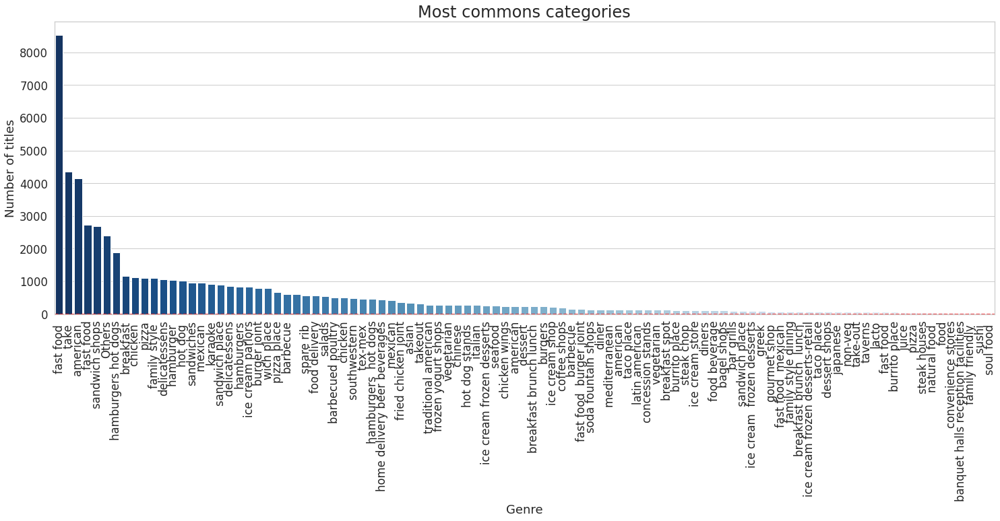

In [50]:
plt.figure(figsize=(25,8))
sns.set(font_scale = 1.5)
sns.set_style('whitegrid') 


pal = sns.color_palette("Blues_r", len(most_common_cat))
rank = most_common_cat['count'].argsort().argsort()  

sns.barplot(most_common_cat['cat'], most_common_cat['count'], palette=np.array(pal[::-1])[rank])
plt.axhline(ls='--', c='red')
plt.title("Most commons categories", fontsize=24)
plt.ylabel('Number of titles', fontsize=18)
plt.xlabel('Genre', fontsize=18)
plt.xticks(rotation='vertical')

plt.show()

In [51]:
# new_df1 = new_df1.dropna()

In [52]:
rowSums = new_df1.iloc[:,1:].sum(axis=1)
multiLabel_counts = rowSums.value_counts()

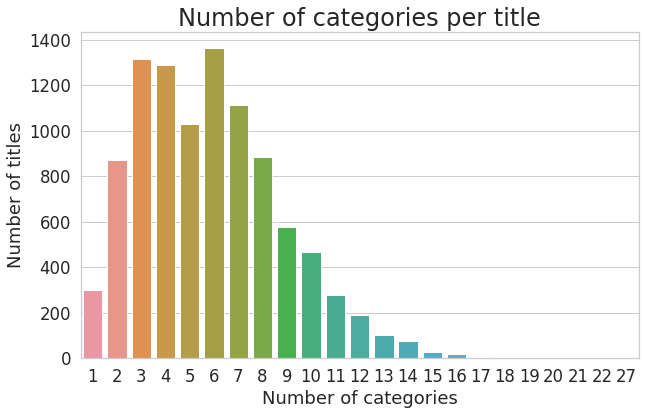

In [53]:
sns.set(font_scale = 1.5)
sns.set_style('whitegrid') 
plt.figure(figsize=(10,6))

sns.barplot(multiLabel_counts.index, multiLabel_counts.values)
plt.title("Number of categories per title", fontsize=24)
plt.ylabel('Number of titles', fontsize=18)
plt.xlabel('Number of categories', fontsize=18)

plt.show()

In [54]:
boxplot = new_df1.copy()
boxplot['len'] = new_df1.detailed_address.apply(lambda x: len(x))

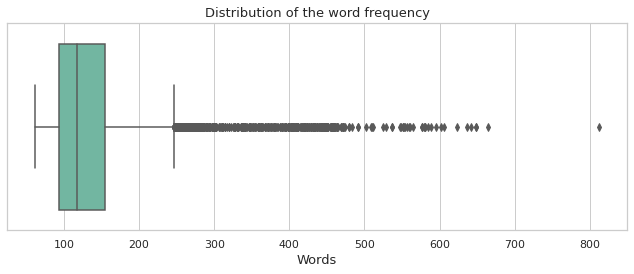

In [55]:
sns.set(style="whitegrid",rc={"font.size":13,"axes.labelsize":13})

plt.figure(figsize=(9, 4))

ax = sns.boxplot(x='len', data=boxplot, orient="h", palette="Set2")
plt.ylabel('')
plt.xlabel('Words')
plt.title("Distribution of the word frequency", fontsize=13)
plt.tight_layout(h_pad=3)

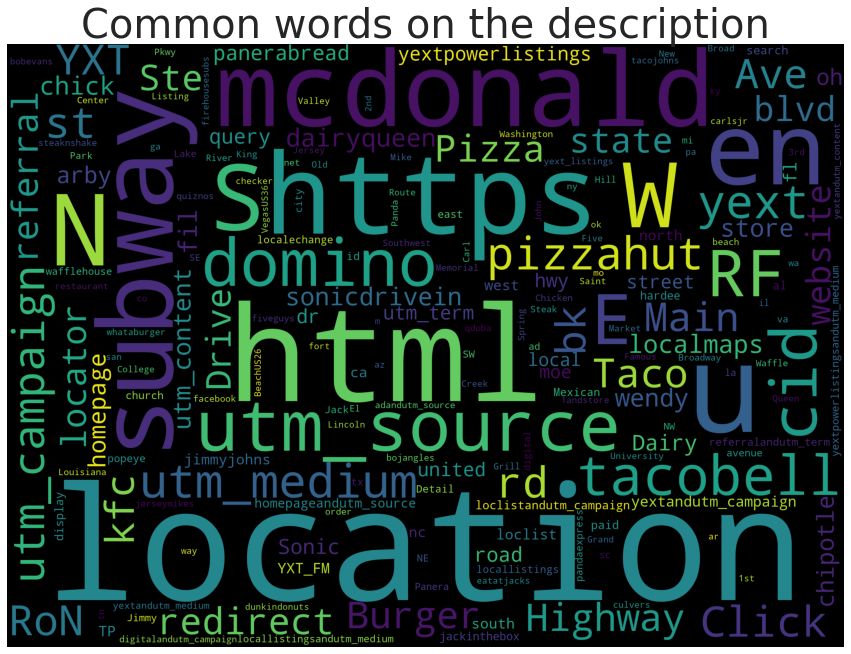

In [56]:
from wordcloud import WordCloud,STOPWORDS

plt.figure(figsize=(15,15))
text = new_df1.detailed_address.values
cloud = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))
plt.axis('off')
plt.title("Common words on the description",fontsize=40)
plt.imshow(cloud)

# **Making columns for result** 

In [57]:
columns=['OneVsAll', 'BinaryRelevance', 'ClassifierChain', 'MultipleOutput','DNN', 'CNN', 'LSTM',]
results = pd.DataFrame(columns = columns)
results


,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM


In [58]:
#
seeds = [1, 43, 678, 90, 135]

In [59]:
t = results.copy()
t

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM


## **TfidfVectorizer** and train-test spilt

In [60]:
X_train, X_test, y_train, y_test = train_test_split(new_df1['detailed_address'], 
                                                    new_df1[new_df1.columns[1:]], 
                                                    test_size=0.3, 
                                                    random_state=seeds[4], 
                                                    shuffle=True)
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2')
vectorizer.fit(X_train)

X_train = vectorizer.transform(X_train)
X_test = vectorizer.transform(X_test)

# **Models**

In [61]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier


LR_pipeline = Pipeline([('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=-1))])
accuracy = 0
for category in new_df1.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    LR_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = LR_pipeline.predict(X_test)
    accuracy = accuracy + accuracy_score(y_test[category], prediction)
    print('AUC ROC score is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged AUC ROC is {}'.format(accuracy/len(new_df1.columns[1:])))

**Processing   titles...**
AUC ROC score is 0.8192159041900274


**Processing  american  titles...**
AUC ROC score is 0.5774157142345312


**Processing  burrito place titles...**
AUC ROC score is 0.790148448043185


**Processing  delicatessens titles...**
AUC ROC score is 0.842346517707228


**Processing  fast food  titles...**
AUC ROC score is 0.5


**Processing  sandwich place titles...**
AUC ROC score is 0.609585170114163


**Processing  taco place titles...**
AUC ROC score is 0.6756257082082581


**Processing american titles...**
AUC ROC score is 0.5


**Processing american  titles...**
AUC ROC score is 0.7383031785178891


**Processing asian  titles...**
AUC ROC score is 0.6388428421984389


**Processing bagel shops titles...**
AUC ROC score is 0.7344104308390024


**Processing banquet halls reception facilities titles...**
AUC ROC score is 0.5


**Processing bar grills titles...**
AUC ROC score is 0.5


**Processing barbecue titles...**
AUC ROC score is 0.8155567628193893


**Pro

In [62]:
from sklearn.naive_bayes import MultinomialNB

NB_pipeline = Pipeline([('clf', OneVsRestClassifier(MultinomialNB(
                    fit_prior=True, class_prior=None)))])
accuracy = 0
for category in new_df1.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    NB_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = NB_pipeline.predict(X_test)
    accuracy = accuracy + accuracy_score(y_test[category], prediction)
    print('AUC ROC is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged AUC ROC is {}'.format(accuracy/len(new_df1.columns[1:])))

**Processing   titles...**
AUC ROC is 0.502906976744186


**Processing  american  titles...**
AUC ROC is 0.5


**Processing  burrito place titles...**
AUC ROC is 0.5


**Processing  delicatessens titles...**
AUC ROC is 0.5


**Processing  fast food  titles...**
AUC ROC is 0.5


**Processing  sandwich place titles...**
AUC ROC is 0.5


**Processing  taco place titles...**
AUC ROC is 0.5


**Processing american titles...**
AUC ROC is 0.5


**Processing american  titles...**
AUC ROC is 0.6843664725428834


**Processing asian  titles...**
AUC ROC is 0.5


**Processing bagel shops titles...**
AUC ROC is 0.5


**Processing banquet halls reception facilities titles...**
AUC ROC is 0.5


**Processing bar grills titles...**
AUC ROC is 0.5


**Processing barbecue titles...**
AUC ROC is 0.5072815533980582


**Processing barbecue  titles...**
AUC ROC is 0.5


**Processing barbecued poultry titles...**
AUC ROC is 0.5029411764705882


**Processing breakfast titles...**
AUC ROC is 0.8272772107384853


In [63]:
from sklearn.svm import LinearSVC

SVC_pipeline = Pipeline([('clf', OneVsRestClassifier(LinearSVC(), n_jobs=1))])

accuracy = 0
for category in new_df1.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    SVC_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = SVC_pipeline.predict(X_test)
    accuracy = accuracy + roc_auc_score(y_test[category], prediction)
    print('F1-score is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged f1-score is {}'.format(accuracy/len(new_df1.columns[1:])))

**Processing   titles...**
F1-score is 0.8577737783233255


**Processing  american  titles...**
F1-score is 0.6179105012360718


**Processing  burrito place titles...**
F1-score is 0.831140350877193


**Processing  delicatessens titles...**
F1-score is 0.8895407219491571


**Processing  fast food  titles...**
F1-score is 0.5246617050067659


**Processing  sandwich place titles...**
F1-score is 0.6663275686673448


**Processing  taco place titles...**
F1-score is 0.9087231377850228


**Processing american titles...**
F1-score is 0.5345500459136823


**Processing american  titles...**
F1-score is 0.7488058969416869


**Processing asian  titles...**
F1-score is 0.8072744829806068


**Processing bagel shops titles...**
F1-score is 0.9698412698412698


**Processing banquet halls reception facilities titles...**
F1-score is 0.5384615384615384


**Processing bar grills titles...**
F1-score is 0.4998303934871099


**Processing barbecue titles...**
F1-score is 0.8357961515544496


**Processing 

In [64]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier

RF_pipeline = Pipeline([('clf', OneVsRestClassifier(RandomForestClassifier(), n_jobs=1))])

accuracy = 0
for category in new_df1.columns[1:]:
    print('**Processing {} titles...**'.format(category))
    
    # Training logistic regression model on train data
    RF_pipeline.fit(X_train, y_train[category])
    
    # calculating test accuracy
    prediction = RF_pipeline.predict(X_test)
    accuracy = accuracy + roc_auc_score(y_test[category], prediction)
    print('AUC ROC is {}'.format(roc_auc_score(y_test[category],prediction)))
    print("\n")

print('Test averaged AUC ROC is {}'.format(accuracy/len(new_df1.columns[1:])))

**Processing   titles...**
AUC ROC is 0.8022550840991275


**Processing  american  titles...**
AUC ROC is 0.5


**Processing  burrito place titles...**
AUC ROC is 0.5833333333333334


**Processing  delicatessens titles...**
AUC ROC is 0.6015660255393885


**Processing  fast food  titles...**
AUC ROC is 0.5


**Processing  sandwich place titles...**
AUC ROC is 0.5


**Processing  taco place titles...**
AUC ROC is 0.5


**Processing american titles...**
AUC ROC is 0.5138888888888888


**Processing american  titles...**
AUC ROC is 0.7328442242993236


**Processing asian  titles...**
AUC ROC is 0.6620986561519273


**Processing bagel shops titles...**
AUC ROC is 0.6658163265306123


**Processing banquet halls reception facilities titles...**
AUC ROC is 0.5


**Processing bar grills titles...**
AUC ROC is 0.5


**Processing barbecue titles...**
AUC ROC is 0.773169534891872


**Processing barbecue  titles...**
AUC ROC is 0.5865384615384616


**Processing barbecued poultry titles...**
AUC ROC

In [65]:
results.loc[4,'OneVsAll'] = accuracy/len(new_df1.columns[1:])
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.647086,NaN,NaN,NaN,NaN,NaN,NaN


In [66]:
#this will take so much time so run for only once and save the results
'''from skmultilearn.problem_transform import BinaryRelevance
from sklearn.naive_bayes import GaussianNB

classifier = BinaryRelev(GausancesianNB())
classifier.fit(X_train, y_train)
predictions = classifier.predict(X_test)
accuracy_score(y_test,predictions)
print('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))'''

"from skmultilearn.problem_transform import BinaryRelevance\nfrom sklearn.naive_bayes import GaussianNB\n\nclassifier = BinaryRelev(GausancesianNB())\nclassifier.fit(X_train, y_train)\npredictions = classifier.predict(X_test)\naccuracy_score(y_test,predictions)\nprint('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))"

In [67]:
#results.loc[4,'BinaryRelevance'] = roc_auc_score(y_test,predictions.toarray())
#results

In [68]:
#this will take so much time so run for only once and save the results
'''from skmultilearn.problem_transform import ClassifierChain
from sklearn.linear_model import LogisticRegression

classifier = ClassifierChain(LogisticRegression())
classifier.fit(X_train, y_train)
predictions = classifier.predict(X_test)

print('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))'''

"from skmultilearn.problem_transform import ClassifierChain\nfrom sklearn.linear_model import LogisticRegression\n\nclassifier = ClassifierChain(LogisticRegression())\nclassifier.fit(X_train, y_train)\npredictions = classifier.predict(X_test)\n\nprint('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))"

In [69]:
#results.loc[4,'ClassifierChain'] = roc_auc_score(y_test,predictions.toarray())
#results

In [70]:
from sklearn.multioutput import MultiOutputClassifier
from sklearn.neighbors import KNeighborsClassifier

clf = MultiOutputClassifier(KNeighborsClassifier()).fit(X_train, y_train)
predictions = clf.predict(X_test)

print('AUC ROC is {}'.format(roc_auc_score(y_test,predictions)))

AUC ROC is 0.7121724167018337


In [71]:
results.loc[4,'MultipleOutput'] = roc_auc_score(y_test,predictions)
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.647086,NaN,NaN,0.712172,NaN,NaN,NaN


# **Deep Learning**
Word Embedding

In [72]:
new_df1['detailed_address']

0       Carl's Jr.2555 11th AvenueGreeleyUS40.39629-10...
1       Del Taco2513 Highway 6 And 50Grand JunctionUS3...
2       Which Wich1125 Patterson RoadGrand JunctionUS3...
3       Chipotle Mexican Grill3455 N Salida CourtAuror...
4       Taco Bell5225 E Colfax AvenueDenverUS39.74044-...
                              ...                        
9995    Church's Chicken Of Birmingham1803 Carolina Av...
9996    Luxury Box8511 Cantilever Way Ste 105RaleighUS...
9997    McDonald's2601 Plover RdPloverUS44.45318-89.54...
9998    Pizza Hut170 E Main StHendersonvilleUS36.30826...
9999    Burger King3400 Westgate DriveDurhamUS35.96586...
Name: detailed_address, Length: 9918, dtype: object

In [73]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer(num_words=5000, lower=True)
tokenizer.fit_on_texts(new_df1['detailed_address'])
sequences = tokenizer.texts_to_sequences(new_df1['detailed_address'])
x = pad_sequences(sequences, maxlen=200)

In [74]:
X_train, X_test, y_train, y_test = train_test_split(x, 
                                                    new_df1[new_df1.columns[1:]], 
                                                    test_size=0.3, 
                                                    random_state=seeds[4])

In [75]:
most_common_cat['class_weight'] = len(most_common_cat) / most_common_cat['count']

In [76]:
most_common_cat['class_weight'] = len(most_common_cat) / most_common_cat['count']
class_weight = {}
for index, label in enumerate(categories):
    class_weight[index] = most_common_cat[most_common_cat['cat'] == categories]['class_weight'].values[0]
    
most_common_cat.head()

,cat,count,class_weight
0,fast food,8521,0.011618
1,take,4362,0.022696
2,american,4153,0.023838
3,fast food,2723,0.036357
4,sandwich shops,2685,0.036872


In [77]:
num_classes = y_train.shape[1]
max_words = len(tokenizer.word_index) + 1
maxlen = 200

In [78]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

# **DNN**

In [79]:
from tensorflow.keras.optimizers import Adam # - Works

In [80]:
from keras.models import load_model
from keras.models import Sequential
from keras.layers import Dense, Embedding, GlobalMaxPool1D, Dropout
#from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import tensorflow as tf

model = Sequential()
model.add(Embedding(max_words, 20, input_length=maxlen))
#model.add(Dropout(0.2))
model.add(GlobalMaxPool1D())
model.add(Dense(num_classes, activation='softmax'))

model.compile(optimizer=Adam(0.015), loss='binary_crossentropy', metrics=[tf.keras.metrics.AUC()])
callbacks = [
    ReduceLROnPlateau(),
    #EarlyStopping(patience=10),
    ModelCheckpoint(filepath='model-simple.h5', save_best_only=True)
]


history = model.fit(X_train, y_train,
                    class_weight=class_weight,
                    epochs=30,
                    batch_size=32,
                    validation_split=0.3,
                    callbacks=callbacks)

Epoch 1/30
152/152 [==============================] - 3s 15ms/step - loss: 0.0025 - auc: 0.7866 - val_loss: 0.1420 - val_auc: 0.8460
Epoch 2/30
152/152 [==============================] - 2s 11ms/step - loss: 0.0015 - auc: 0.8687 - val_loss: 0.1132 - val_auc: 0.8930
Epoch 3/30
152/152 [==============================] - 2s 14ms/step - loss: 0.0012 - auc: 0.8905 - val_loss: 0.1046 - val_auc: 0.8995
Epoch 4/30
152/152 [==============================] - 2s 11ms/step - loss: 0.0011 - auc: 0.8913 - val_loss: 0.1014 - val_auc: 0.8721
Epoch 5/30
152/152 [==============================] - 2s 11ms/step - loss: 0.0011 - auc: 0.8851 - val_loss: 0.1013 - val_auc: 0.8524
Epoch 6/30
152/152 [==============================] - 2s 12ms/step - loss: 9.9745e-04 - auc: 0.8768 - val_loss: 0.1013 - val_auc: 0.8605
Epoch 7/30
152/152 [==============================] - 2s 11ms/step - loss: 9.5813e-04 - auc: 0.8697 - val_loss: 0.1025 - val_auc: 0.8419
Epoch 8/30
152/152 [==============================] - 2s 11ms

In [81]:
dnn_model = model
metrics = dnn_model.evaluate(X_test, y_test)
print("{}: {}".format(dnn_model.metrics_names[1], metrics[1]))

93/93 [==============================] - 1s 3ms/step - loss: 0.1106 - auc: 0.7954
auc: 0.7954316735267639


In [82]:
results.loc[4,'DNN'] = metrics[1]
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.647086,NaN,NaN,0.712172,0.795432,NaN,NaN


# **CNN**

In [83]:
from keras.layers import Dense, Activation, Embedding, Flatten, GlobalMaxPool1D, Dropout, Conv1D

filter_length = 300

model = Sequential()
model.add(Embedding(max_words, 20, input_length=maxlen))
#model.add(Dropout(0.5))
model.add(Conv1D(filter_length, 3, padding='valid', activation='relu', strides=1))
model.add(GlobalMaxPool1D())
model.add(Dense(num_classes))
model.add(Activation('softmax'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[tf.keras.metrics.AUC()])

callbacks = [
    ReduceLROnPlateau(),
    ModelCheckpoint(filepath='model-conv1d.h5', save_best_only=True)
]

history = model.fit(X_train, y_train,
                    class_weight=class_weight,
                    epochs=30,
                    batch_size=32,
                    validation_split=0.3,
                    callbacks=callbacks)

Epoch 1/30
152/152 [==============================] - 6s 36ms/step - loss: 0.0035 - auc_1: 0.7378 - val_loss: 0.1629 - val_auc_1: 0.8110
Epoch 2/30
152/152 [==============================] - 5s 34ms/step - loss: 0.0018 - auc_1: 0.8299 - val_loss: 0.1390 - val_auc_1: 0.8483
Epoch 3/30
152/152 [==============================] - 6s 39ms/step - loss: 0.0015 - auc_1: 0.8486 - val_loss: 0.1173 - val_auc_1: 0.8462
Epoch 4/30
152/152 [==============================] - 5s 35ms/step - loss: 0.0013 - auc_1: 0.8697 - val_loss: 0.1043 - val_auc_1: 0.8739
Epoch 5/30
152/152 [==============================] - 5s 34ms/step - loss: 0.0011 - auc_1: 0.8847 - val_loss: 0.0968 - val_auc_1: 0.8930
Epoch 6/30
152/152 [==============================] - 5s 34ms/step - loss: 0.0011 - auc_1: 0.8819 - val_loss: 0.0925 - val_auc_1: 0.8740
Epoch 7/30
152/152 [==============================] - 5s 35ms/step - loss: 9.9007e-04 - auc_1: 0.8805 - val_loss: 0.0900 - val_auc_1: 0.8643
Epoch 8/30
152/152 [=================

In [84]:
cnn_model = model
metrics = cnn_model.evaluate(X_test, y_test)
print("{}: {}".format(model.metrics_names[1], metrics[1]))

93/93 [==============================] - 1s 7ms/step - loss: 0.0933 - auc_1: 0.7757
auc_1: 0.7757354974746704


In [85]:
results.loc[4,'CNN'] = metrics[1]
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.647086,NaN,NaN,0.712172,0.795432,0.775735,NaN


# **GloVe - LSTM** 

In [86]:
from numpy import array
from numpy import asarray
from numpy import zeros

embeddings_dictionary = dict()

glove_file = open('../input/glove6b100dtxt/glove.6B.100d.txt', encoding="utf8")

for line in glove_file:
    records = line.split()
    word = records[0]
    vector_dimensions = asarray(records[1:], dtype='float32')
    embeddings_dictionary[word] = vector_dimensions
glove_file.close()

embedding_matrix = zeros((max_words, 100))
for word, index in tokenizer.word_index.items():
    embedding_vector = embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector

In [87]:
from keras.layers import Input
from keras.layers import Flatten, LSTM
from keras.models import Model

deep_inputs = Input(shape=(maxlen,))
embedding_layer = Embedding(max_words, 100, weights=[embedding_matrix], trainable=False)(deep_inputs)
LSTM_Layer_1 = LSTM(128)(embedding_layer)
dense_layer_1 = Dense(99, activation='softmax')(LSTM_Layer_1)
model = Model(inputs=deep_inputs, outputs=dense_layer_1)

callbacks = [
    ReduceLROnPlateau(),
    ModelCheckpoint(filepath='model-conv1d.h5', save_best_only=True)
]

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=[tf.keras.metrics.AUC()])
history = model.fit(X_train, y_train.values,
                    class_weight=class_weight,
                    batch_size=32, 
                    epochs=30, 
                    validation_split=0.3,
                    callbacks=callbacks)

Epoch 1/30
152/152 [==============================] - 40s 244ms/step - loss: 0.0025 - auc_2: 0.7756 - val_loss: 0.1615 - val_auc_2: 0.7988
Epoch 2/30
152/152 [==============================] - 36s 238ms/step - loss: 0.0018 - auc_2: 0.8165 - val_loss: 0.1530 - val_auc_2: 0.8242
Epoch 3/30
152/152 [==============================] - 36s 239ms/step - loss: 0.0018 - auc_2: 0.8270 - val_loss: 0.1458 - val_auc_2: 0.8301
Epoch 4/30
152/152 [==============================] - 37s 244ms/step - loss: 0.0017 - auc_2: 0.8375 - val_loss: 0.1399 - val_auc_2: 0.8399
Epoch 5/30
152/152 [==============================] - 38s 249ms/step - loss: 0.0016 - auc_2: 0.8419 - val_loss: 0.1365 - val_auc_2: 0.8330
Epoch 6/30
152/152 [==============================] - 37s 243ms/step - loss: 0.0016 - auc_2: 0.8444 - val_loss: 0.1336 - val_auc_2: 0.8432
Epoch 7/30
152/152 [==============================] - 37s 244ms/step - loss: 0.0015 - auc_2: 0.8493 - val_loss: 0.1314 - val_auc_2: 0.8501
Epoch 8/30
152/152 [=======

In [88]:
metrics = model.evaluate(X_test, y_test)
print("{}: {}".format(model.metrics_names[1], metrics[1]))

93/93 [==============================] - 7s 69ms/step - loss: 0.0956 - auc_2: 0.8933
auc_2: 0.8932636380195618


In [89]:
results.loc[4,'LSTM'] = metrics[1]
results

,OneVsAll,BinaryRelevance,ClassifierChain,MultipleOutput,DNN,CNN,LSTM
4,0.647086,NaN,NaN,0.712172,0.795432,0.775735,0.893264


# **ANN**

In [90]:
# Feature Scaling because yes we don't want one independent variable dominating the other and it makes computations easy
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [91]:
# sequential model to initialise our ann and dense module to build the layers
from keras.models import Sequential
from keras.layers import Dense
#Initialising ANN
ann = tf.keras.models.Sequential()
 #Adding First Hidden Layer
ann.add(tf.keras.layers.Dense(units=1,activation="relu"))
 #Adding Second Hidden Layer
ann.add(tf.keras.layers.Dense(units=6,activation="relu"))
#Adding Output Layer
ann.add(tf.keras.layers.Dense(units=1,activation="softmax"))
#Compiling ANN
ann.compile(optimizer="adam",loss="binary_crossentropy",metrics=['accuracy'])

In [1]:
#Fitting ANN
# ann.fit(X_train,y_train,batch_size=30,epochs = 100)

# **Results**

In [ ]:
def highlight_max(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    if data.ndim == 1:  # Series from .apply(axis=0) or axis=1
        is_max = data == data.max()
        return [attr if v else '' for v in is_max]
    else:  # from .apply(axis=None)
        is_max = data == data.max().max()
        return pd.DataFrame(np.where(is_max, attr, ''),
                            index=data.index, columns=data.columns)

In [ ]:
def highlight_min(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    if data.ndim == 1:  # Series from .apply(axis=0) or axis=1
        is_min = data == data.min()
        return [attr if v else '' for v in is_min]
    else:  # from .apply(axis=None)
        is_min = data == data.min().min()
        return pd.DataFrame(np.where(is_min, attr, ''),
                            index=data.index, columns=data.columns)

In [ ]:
results.style.apply(highlight_min, color='red', axis=None).apply(highlight_max, color='lightgreen', axis=None)

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

#cm = sns.light_palette("green", as_cmap=True)
cm = LinearSegmentedColormap.from_list(
    name='test', 
    #colors=['red','white','green','white','red']
    colors=['tomato','orange','white','lightgreen','green']
)

t = results.apply(pd.to_numeric).style.background_gradient(cmap=cm)
t